In [25]:
!pip install -r Requirements.txt


   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------------------------------------- 0/4 [pytz]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   ---------- ----------------------------- 1/4 [zope.interface]
   -------------------- ------------------- 2/4 [datetime]
   -------------------- ------------------- 2/4 [datetime]
   ------------------


[notice] A new release of pip is available: 25.2 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
import numpy as np
import matplotlib.pyplot as plt 
import sys, glob 
import soundfile as sf 
import sofa
import librosa 
from scipy import signal 
from IPython.display import Audio 
import xarray as xr

In [7]:
import sys
from pathlib import Path
_root = Path.cwd().parent  # notebooks/ -> project root
if str(_root) not in sys.path:
    sys.path.insert(0, str(_root))
ROOT = _root

In [8]:
from netCDF4 import Dataset

with Dataset(ROOT /"dataset" /"IRC_1002_C_44100.sofa") as f:
    # Check what attributes actually exist
    print("Global attributes:", f.ncattrs())
    print("Variables:", list(f.variables.keys()))

Global attributes: ['Data.SamplingRate.Units', 'NC_GLOBAL._NCProperties', 'NC_GLOBAL.Conventions', 'NC_GLOBAL.Version', 'NC_GLOBAL.SOFAConventions', 'NC_GLOBAL.SOFAConventionsVersion', 'NC_GLOBAL.DataType', 'NC_GLOBAL.RoomType', 'NC_GLOBAL.Title', 'NC_GLOBAL.DateCreated', 'NC_GLOBAL.DateModified', 'NC_GLOBAL.APIName', 'NC_GLOBAL.APIVersion', 'NC_GLOBAL.AuthorContact', 'NC_GLOBAL.Organization', 'NC_GLOBAL.License', 'NC_GLOBAL.ApplicationName', 'NC_GLOBAL.ApplicationVersion', 'NC_GLOBAL.Comment', 'NC_GLOBAL.History', 'NC_GLOBAL.References', 'NC_GLOBAL.Origin', 'NC_GLOBAL.RoomShortName', 'NC_GLOBAL.RoomDescription', 'NC_GLOBAL.RoomLocation', 'NC_GLOBAL.ListenerShortName', 'NC_GLOBAL.ListenerDescription', 'NC_GLOBAL.SourceShortName', 'NC_GLOBAL.SourceDescription', 'NC_GLOBAL.ReceiverShortName', 'NC_GLOBAL.ReceiverDescription', 'NC_GLOBAL.EmitterShortName', 'NC_GLOBAL.EmitterDescription', 'NC_GLOBAL.DatabaseName', 'NC_GLOBAL.URL', 'NC_GLOBAL.RoomVolume']
Variables: ['Data.SamplingRate', 'Li

[HRTF] Convention CW (90deg=droite) detectee -> azimuts convertis en CCW SOFA standard
Dataset : HRTF(positions=187, samples=512, sr=44100 Hz, source='IRC_1002_C_44100.sofa')


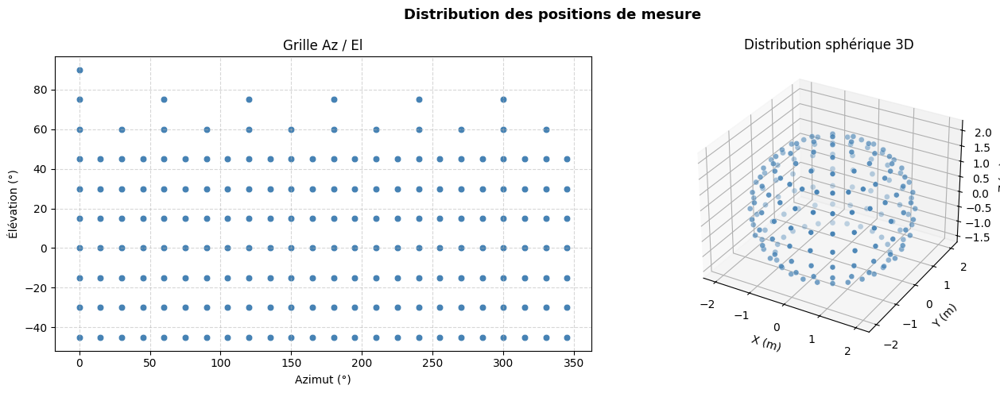

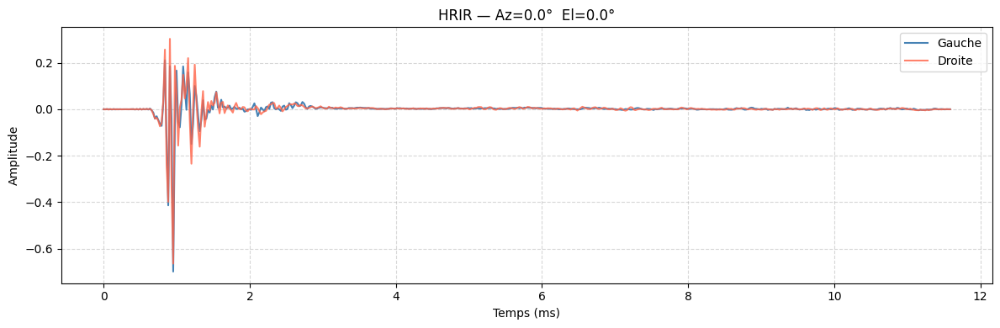

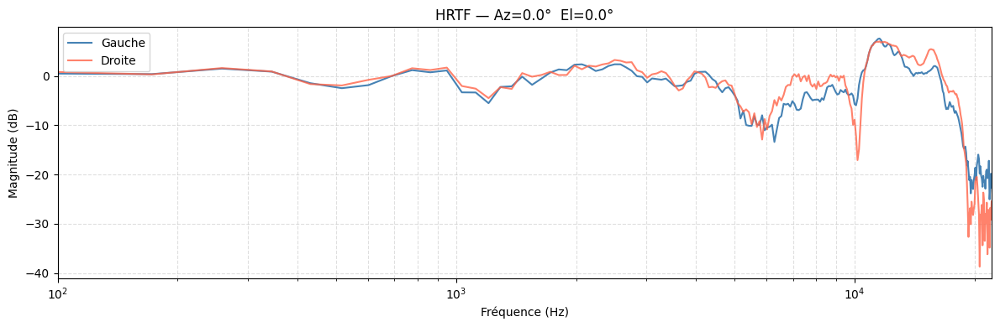

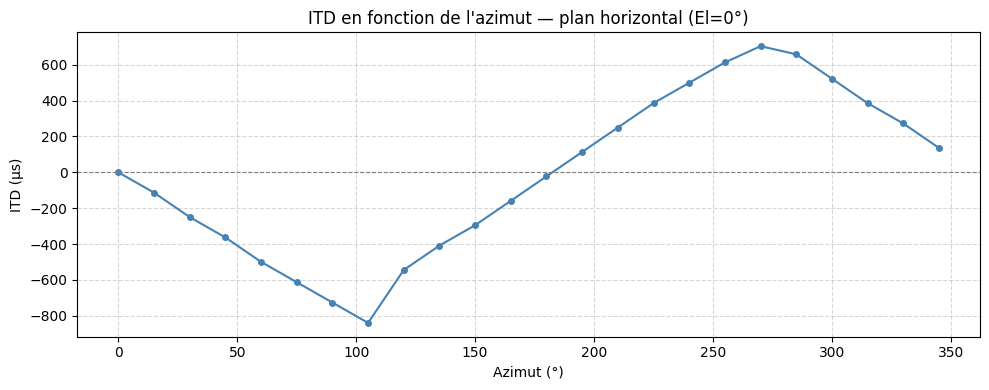

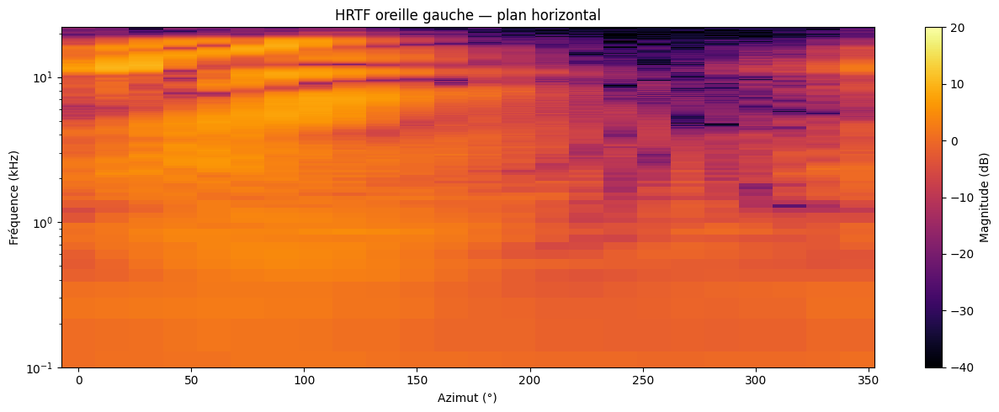

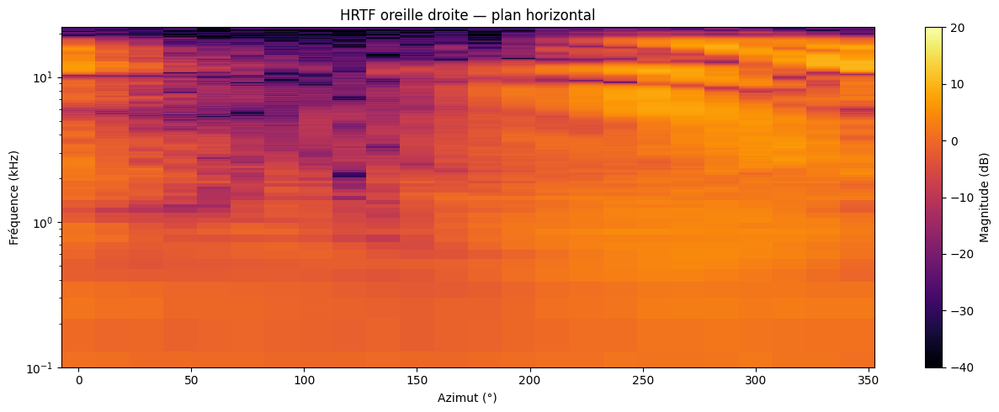

In [9]:
from hrtf import HRTF
from visualisation import HRTFVisualizer

hrtf = HRTF.from_sofa(ROOT / "dataset" /"IRC_1002_C_44100.sofa")
viz  = HRTFVisualizer(hrtf)
viz.plot_all()                          # tout d'un coup


In [ ]:
from GenerateSound import * 
imp = Impulse(frequency=0.5, duration=10, amplitude=1.0, save=False)
signal = imp.generate()  # → sound/generated/impulse_0.5Hz_10s.wav

# Ecouter l'impulsion
Audio(signal, rate=imp.sr , normalize = False)

In [ ]:
la = Note(note="LA", octave=4, duration=10, save=False)   # 440 Hz
si = Note(note="SI", octave=4, duration=10, save=False)   # 493.88 Hz
do5 = Note(note="DO", octave=5, duration=10, save=False)  # 523.25 Hz

signal_la = la.generate()  # → sound/generated/note_LA4_440.00Hz_10s.wav
signal_si = si.generate()  
signal_do5 = do5.generate()  

Audio(signal_do5, rate=la.sr, normalize = False)

In [19]:
burst = BurstNote(note="LA", octave=4, burst_duration=1.0, repeat_every=2.0, duration=10, save=False)
signal_burst = burst.generate()  # → sound/generated/burst_LA4_1.0s_every2.0s_10s.wav
Audio(signal, rate=burst.sr, normalize = False)

In [5]:
from hrtf import HRTF
from Convolution import HRTFConvolver
from Soundsource import SoundSource
from IPython.display import Audio

# 1. Charger le dataset
hrtf = HRTF.from_sofa( ROOT / "dataset" / "IRC_1002_C_44100.sofa")

# 2. Définir la source positionnée
source = SoundSource.from_generator(do5, azimuth=90, elevation=0, distance=2.06)

# 3. Créer le convolveur depuis la source (charge le signal automatiquement)
convolver = HRTFConvolver.from_source(hrtf, source)

# 4. Lancer la convolution
convolver.run()

# 5. Sauvegarder
convolver.save(path_left="Left.wav", path_right="Right.wav", path_merged="Merged_audio.wav")


ModuleNotFoundError: No module named 'hrtf'

In [47]:
Audio(filename=str(ROOT / "sound" / "generated" / "Merged_audio.wav"))

[HRTF] Convention CW (90°=droite) détectée → azimuts convertis en CCW SOFA standard


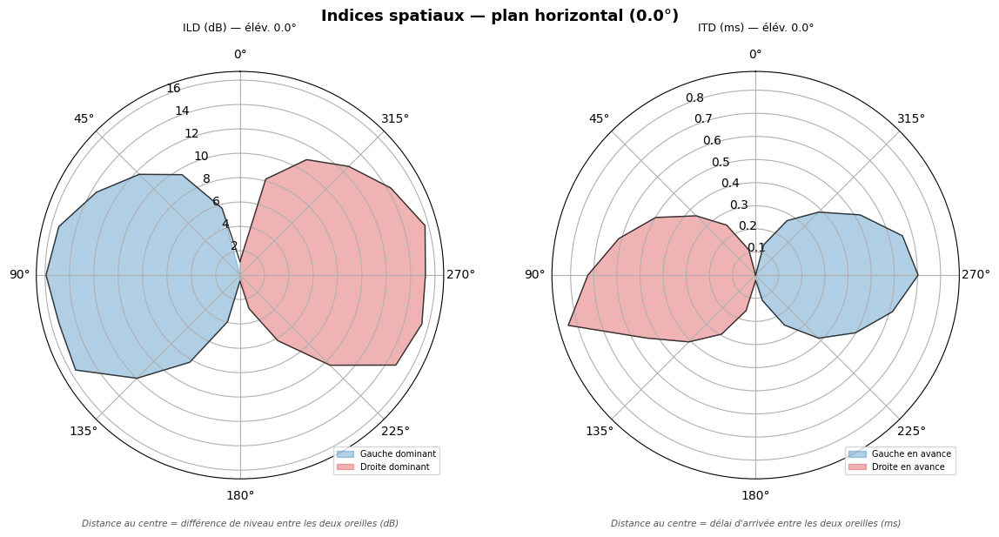

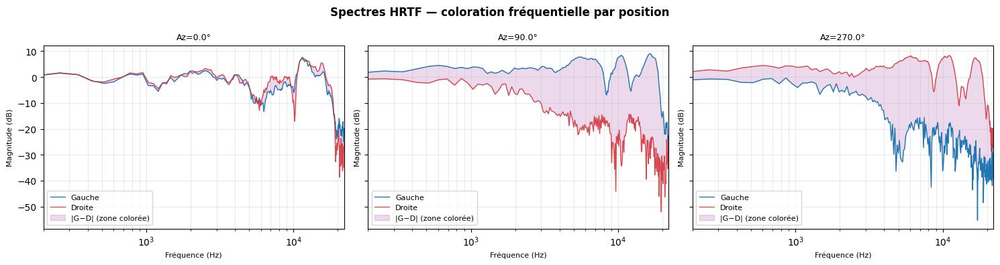


── Vérification pipeline (convolution Dirac → ILD) ──────────
[Pipeline check] Az=0.0°  Él=0.0°
  ILD mesuré  : -1.12 dB
  Attendu     : ILD ≈ 0 dB  (source devant/derrière)
  Résultat    : ✓ OK


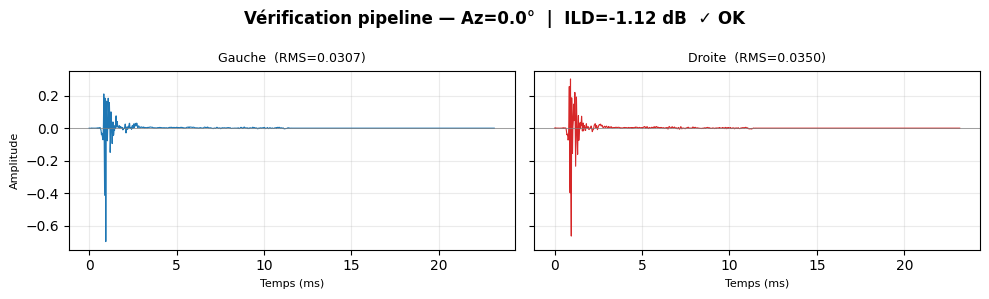

[Pipeline check] Az=90.0°  Él=0.0°
  ILD mesuré  : +15.92 dB
  Attendu     : ILD > 0 dB  (source à gauche)
  Résultat    : ✓ OK


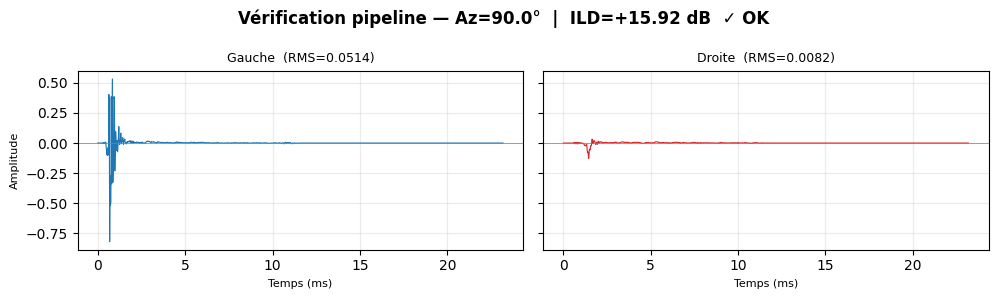

[Pipeline check] Az=270.0°  Él=0.0°
  ILD mesuré  : -15.22 dB
  Attendu     : ILD < 0 dB  (source à droite)
  Résultat    : ✓ OK


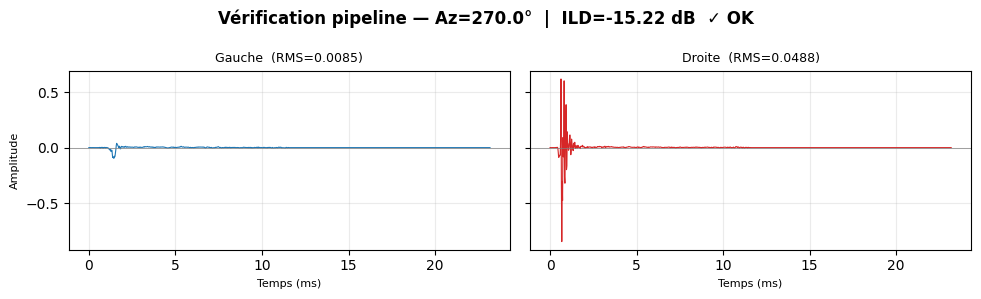

In [3]:
from SpatialisationVerif import SpatialisationVerif
hrtf = HRTF.from_sofa(ROOT / "dataset" / "IRC_1002_C_44100.sofa")

verifier = SpatialisationVerif(hrtf)
verifier.plot_all(
)

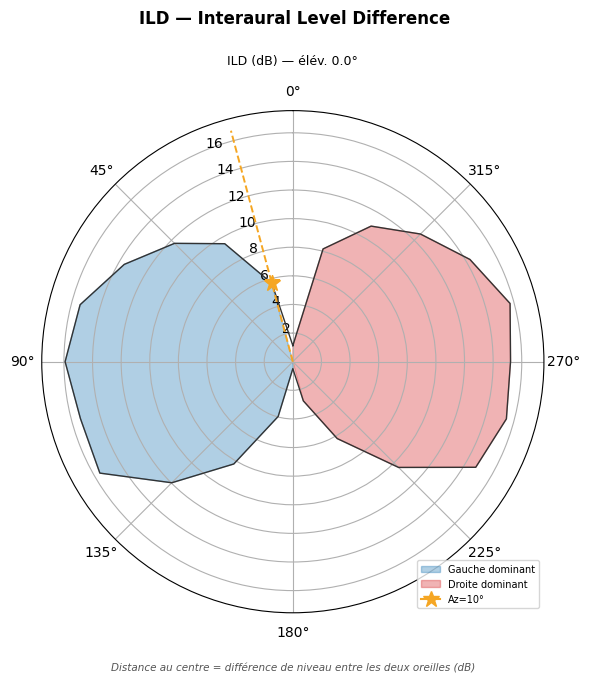

In [11]:
verifier.plot_ild_polar(highlight_az=10)

In [11]:
from GenerateSound import Note, BurstNote
from Soundsource import SoundSource
from Soundscape import Soundscape

# ── 1. Générer les notes en mémoire ───────────────────────────────────

la = Note(note="LA", octave=4, duration=10, save=False)   # 440 Hz
do5 = Note(note="DO", octave=5, duration=10, save=False)  # 523.25 Hz

signal_la = la.generate()  # → sound/generated/note_LA4_440.00Hz_10s.wav
signal_do5 = do5.generate()  

# ── 2. Construire le paysage sonore ───────────────────────────────────
scene = Soundscape(hrtf)

# DO — légèrement à gauche devant
scene.add_source(SoundSource.from_generator(do5, azimuth=0, elevation=0, distance=2.06))

# SI — légèrement à droite devant
scene.add_source(SoundSource.from_generator(la, azimuth=290, elevation=0, distance=2.06))

# ── 3. Rendre et sauvegarder ──────────────────────────────────────────
stereo = scene.render()
#scene.save(ROOT / "sound" / "generated" / "soundscape_do_si.wav")

# ── 4. Écouter ────────────────────────────────────────────────────────
Audio(filename=str(ROOT / "sound" / "generated" / "soundscape_do_si.wav"))


[Soundscape] Source ajoutée : SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=0°, el=0°, dist=2.06m, gain=1.0)
[Soundscape] Source ajoutée : SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=290°, el=0°, dist=2.06m, gain=1.0)

[Soundscape] Traitement source 1/2 — SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=0°, el=0°, dist=2.06m, gain=1.0)
[HRTFInterpolator] Cible (0.0, 0.0) deg -- sur grille, HRIR mesuree : Az=0.0 El=0.0 deg
[HRTFConvolver] Position sélectionnée : Az=0.0°  El=0.0°  (indice 72)
[HRTFConvolver] Convolution canal gauche...
[HRTFConvolver] Convolution canal droit...
[HRTFConvolver] Sortie : 441511 échantillons (10.01s)
[DistanceModel] Gain : 1.0000  (r=2.06 m → 0.0 dB)
[HRTFConvolver] merged_audio prêt : shape=(441511, 2)

[Soundscape] Traitement source 2/2 — SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=290°, el=0°, dist=2.06m, gain=1.0)
[HRTFInterpolator] Cible (290.0, 0.0) deg -- triangle :
  A  Az= 300.0 El=  0.0 deg  w=0.332  ta

In [22]:
import importlib
import GenerateSound as gs_mod
importlib.reload(gs_mod)
from GenerateSound import BurstNote
from Soundsource import SoundSource
from Soundscape import Soundscape

# ── 1. Générer les deux notes avec décalage ───────────────────────────
# DO  — frappe à t=0s, 2s, 4s, ...   → oreille gauche
do_gauche = BurstNote(
    note="DO", octave=5,
    burst_duration=0.8,   # durée de chaque note
    repeat_every=2.0,     # période du ping-pong
    offset_seconds=0.0,   # commence dès t=0
    duration=10.0,
)

# LA  — frappe à t=1s, 3s, 5s, ...   → oreille droite (déphasé de 1s)
la_droite = BurstNote(
    note="LA", octave=4,
    burst_duration=0.8,
    repeat_every=2.0,
    offset_seconds=1.0,   # décalé d'1 seconde → effet ping-pong
    duration=10.0,
)

# ── 2. Construire la scène ────────────────────────────────────────────
scene = Soundscape(hrtf)

scene.add_source(SoundSource.from_generator(do_gauche, azimuth=90,  elevation=45, distance=10))
scene.add_source(SoundSource.from_generator(la_droite, azimuth=270, elevation=-45, distance=10))

# ── 3. Rendre et sauvegarder ──────────────────────────────────────────
scene.render()
scene.save(ROOT / "sound" / "generated" / "pingpong_do_la.wav")

# ── 4. Écouter ────────────────────────────────────────────────────────
Audio(filename=str(ROOT / "sound" / "generated" / "pingpong_do_la.wav"))


[Soundscape] Source ajoutée : SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=90°, el=45°, dist=10m, gain=1.0)
[Soundscape] Source ajoutée : SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=270°, el=-45°, dist=10m, gain=1.0)

[Soundscape] Traitement source 1/2 — SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=90°, el=45°, dist=10m, gain=1.0)
[HRTFInterpolator] Cible (90.0, 45.0) deg -- sur grille, HRIR mesuree : Az=90.0 El=45.0 deg
[HRTFConvolver] Position sélectionnée : Az=90.0°  El=45.0°  (indice 162)
[HRTFConvolver] Convolution canal gauche...
[HRTFConvolver] Convolution canal droit...
[HRTFConvolver] Sortie : 441511 échantillons (10.01s)
[DistanceModel] Retard : 1021 éch. (23.2 ms, Δr=7.94 m)
[DistanceModel] Gain : 0.2060  (r=10.00 m → -13.7 dB)
[HRTFConvolver] merged_audio prêt : shape=(442532, 2)

[Soundscape] Traitement source 2/2 — SoundSource(signal=<array 441000 samples @ 44100 Hz>, az=270°, el=-45°, dist=10m, gain=1.0)
[HRTFInterpolator] Cible (270.

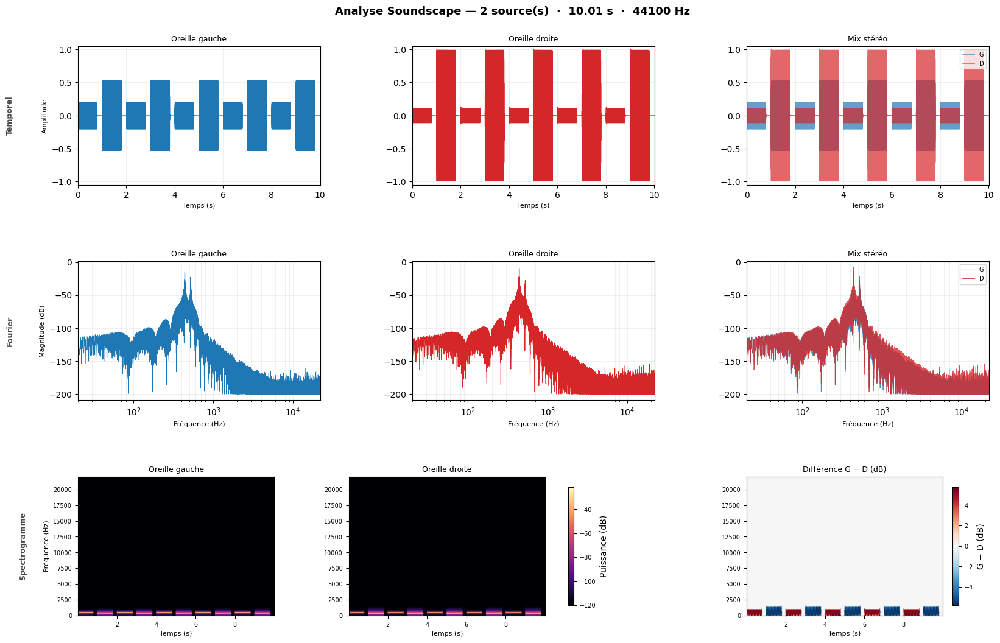

In [49]:
from SoundVisu import SoundVisu

visu = SoundVisu(scene)
visu.plot_all()

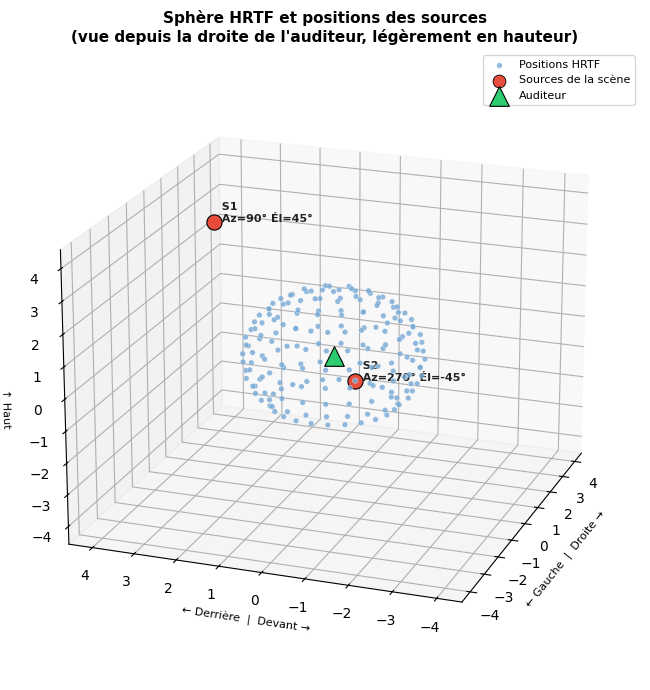

In [14]:
import importlib
import SoundVisu as sv_mod

importlib.reload(sv_mod)

visu = sv_mod.SoundVisu(scene)
visu.plot_scene_sphere()

In [20]:
#### positionement du point d'émission du son sur un couple (el, az) non présent sur le maillage ###

from hrtf import HRTF
from HRTFInterpolator import HRTFInterpolator
from Convolution import HRTFConvolver
from Soundsource import SoundSource
from IPython.display import Audio

#1 — tout le reste est inchangé
hrtf = HRTFInterpolator(HRTF.from_sofa(ROOT / "dataset" / "IRC_1002_C_44100.sofa"))

# 2. Définir la source positionnée
source = SoundSource.from_generator(do5, azimuth=0.1, elevation=65.07, distance=2.06)

# 3. Créer le convolveur depuis la source (charge le signal automatiquement)
convolver = HRTFConvolver.from_source(hrtf, source)

# 4. Lancer la convolution
convolver.run()

# 5. Sauvegarder
convolver.save(path_left="Left.wav", path_right="Right.wav", path_merged="Merged_audio.wav")

#6. Ecoute
Audio(filename=str(ROOT / "sound" / "generated" / "Merged_audio.wav"))


[HRTF] Convention CW (90deg=droite) detectee -> azimuts convertis en CCW SOFA standard
[HRTFInterpolator] Cible (0.1, 65.1) deg -- triangle :
  A  Az=   0.0 El= 60.0 deg  w=0.661  tauL=42  tauR=42 smp
  B  Az=  30.0 El= 60.0 deg  w=0.003  tauL=40  tauR=45 smp
  C  Az=   0.0 El= 75.0 deg  w=0.337  tauL=42  tauR=42 smp
  -> tau_interp  L=41.99 smp  R=42.01 smp
[HRTFConvolver] Position sélectionnée : Az=0.0°  El=59.99999999999999°  (indice 168)
[HRTFConvolver] Convolution canal gauche...
[HRTFConvolver] Convolution canal droit...
[HRTFConvolver] Sortie : 441511 échantillons (10.01s)
[DistanceModel] Gain : 1.0000  (r=2.06 m → 0.0 dB)
[HRTFConvolver] merged_audio prêt : shape=(441511, 2)
[HRTFConvolver] Sauvegardé : c:\son_spatialisation\sound\generated\Left.wav
[HRTFConvolver] Sauvegardé : c:\son_spatialisation\sound\generated\Right.wav
[HRTFConvolver] Sauvegardé : Merged_audio.wav
